In [1]:
import os 
import sys

import sklearn as sk
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.ensemble import RandomForestClassifier
from imblearn.over_sampling import SMOTE
from xgboost import XGBClassifier
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt 
import xgboost as xgb

from scipy.stats import kurtosis, entropy
from scipy.fft import fft

sys.path.append(r"c:\Users\keng-tse\Desktop\csi_tool") #這行為絕對路徑，如需使用，必須要修改為當前決路徑
import csi_tool
import denoise 

In [2]:
# 每個點的實際位置 (x, y)，基於 0.6m 的間距
spacing = 0.6  # 每隔 0.6m
coordinates = {
    # 下邊界 (1-10 和 40-31)
    1: (0, 0), 40: (0.6, 0), 39: (1.2, 0), 38: (1.8, 0), 37: (2.4, 0),
    36: (3.0, 0), 35: (3.6, 0), 34: (4.2, 0), 33: (4.8, 0), 32: (5.4, 0), 31: (6.0, 0),

    # 左邊界 (1-11)
    2: (0, 0.6), 3: (0, 1.2), 4: (0, 1.8), 5: (0, 2.4),
    6: (0, 3.0), 7: (0, 3.6), 8: (0, 4.2), 9: (0, 4.8), 10: (0, 5.4), 11: (0, 6.0),

    # 上邊界 (11-21)
    12: (0.6, 6.0), 13: (1.2, 6.0), 14: (1.8, 6.0), 15: (2.4, 6.0),
    16: (3.0, 6.0), 17: (3.6, 6.0), 18: (4.2, 6.0), 19: (4.8, 6.0),
    20: (5.4, 6.0), 21: (6.0, 6.0),

    # 右邊界 (21-31)
    22: (6.0, 5.4), 23: (6.0, 4.8), 24: (6.0, 4.2), 25: (6.0, 3.6),
    26: (6.0, 3.0), 27: (6.0, 2.4), 28: (6.0, 1.8), 29: (6.0, 1.2), 30: (6.0, 0.6),

    # 中間點 (41-49)
    41: (3.0, 0.6), 42: (3.0, 1.2), 43: (3.0, 1.8),
    44: (3.0, 2.4), 45: (3.0, 3.0), 46: (3.0, 3.6),
    47: (3.0, 4.2), 48: (3.0, 4.8), 49: (3.0, 5.4)
}

In [10]:
base_path = r"C:\Users\keng-tse\Desktop\csi_tool\csi_dataset\localization_phone\1205_phone\20Mhz\csv"
reference_points = {}
# 生成 reference_points 字典
for ref_id, coord in coordinates.items():
    folder_path = os.path.join(base_path, f"reference_point_{ref_id}.xlsx")
    reference_points[folder_path] = (ref_id, coord)

# 打印結果
for path, (ref_id, coord) in reference_points.items():
    print(f"Path: {path}, ID: {ref_id}, Coordinates: {coord}")

Path: C:\Users\keng-tse\Desktop\csi_tool\csi_dataset\localization_phone\1205_phone\20Mhz\csv\reference_point_1.xlsx, ID: 1, Coordinates: (0, 0)
Path: C:\Users\keng-tse\Desktop\csi_tool\csi_dataset\localization_phone\1205_phone\20Mhz\csv\reference_point_40.xlsx, ID: 40, Coordinates: (0.6, 0)
Path: C:\Users\keng-tse\Desktop\csi_tool\csi_dataset\localization_phone\1205_phone\20Mhz\csv\reference_point_39.xlsx, ID: 39, Coordinates: (1.2, 0)
Path: C:\Users\keng-tse\Desktop\csi_tool\csi_dataset\localization_phone\1205_phone\20Mhz\csv\reference_point_38.xlsx, ID: 38, Coordinates: (1.8, 0)
Path: C:\Users\keng-tse\Desktop\csi_tool\csi_dataset\localization_phone\1205_phone\20Mhz\csv\reference_point_37.xlsx, ID: 37, Coordinates: (2.4, 0)
Path: C:\Users\keng-tse\Desktop\csi_tool\csi_dataset\localization_phone\1205_phone\20Mhz\csv\reference_point_36.xlsx, ID: 36, Coordinates: (3.0, 0)
Path: C:\Users\keng-tse\Desktop\csi_tool\csi_dataset\localization_phone\1205_phone\20Mhz\csv\reference_point_35.xlsx

In [11]:
def load_data(reference_points):
    data = []          # 用于存储所有数据
    rp_labels = []     # 用于存储参考点编号标签
    coord_labels = []  # 用于存储 (x, y) 坐标标签

    for path, (ref_id, coord) in reference_points.items():
        df = pd.read_excel(path)
        data.append(df.values)
        rp_labels.extend([ref_id] * len(df))
        coord_labels.extend([coord] * len(df))
    data = pd.DataFrame(np.vstack(data))
    rp_labels = pd.Series(rp_labels, name="Reference Point ID")
    coord_labels = pd.DataFrame(coord_labels, columns=["X", "Y"])
    return data, rp_labels, coord_labels

In [12]:
data, rp_labels, coord_labels = load_data(reference_points)

In [13]:
# 分離CFR和CIR數據
amp_data = data.iloc[:, :48]  
phase_data = data.iloc[:, 48:] 

def to_db(amplitude):
    # 防止對零取對數
    return 10 * np.log10(np.maximum(amplitude, 1e-10))

amp_db = to_db(amp_data)
print(amp_db.shape)

(24404, 48)


In [14]:
import matplotlib.pyplot as plt
import numpy as np

In [15]:
unique_ref_ids = rp_labels.unique()
amp_data = np.array(amp_db)
phase_data = np.array(phase_data)

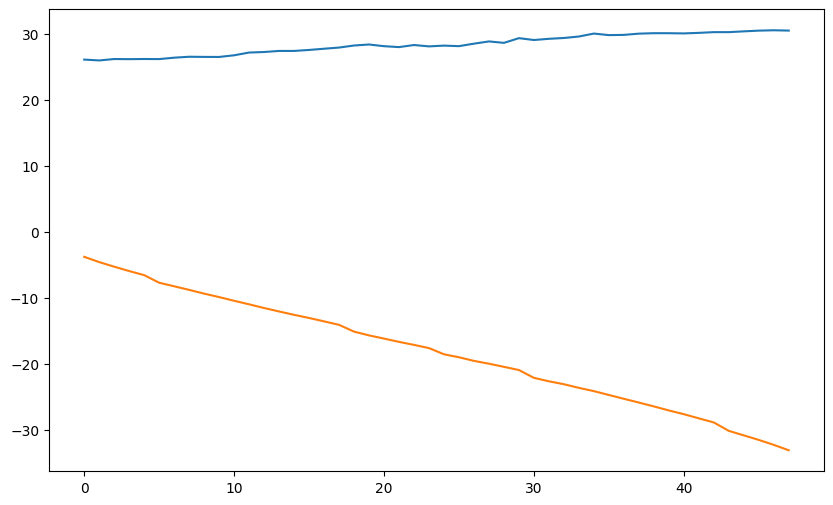

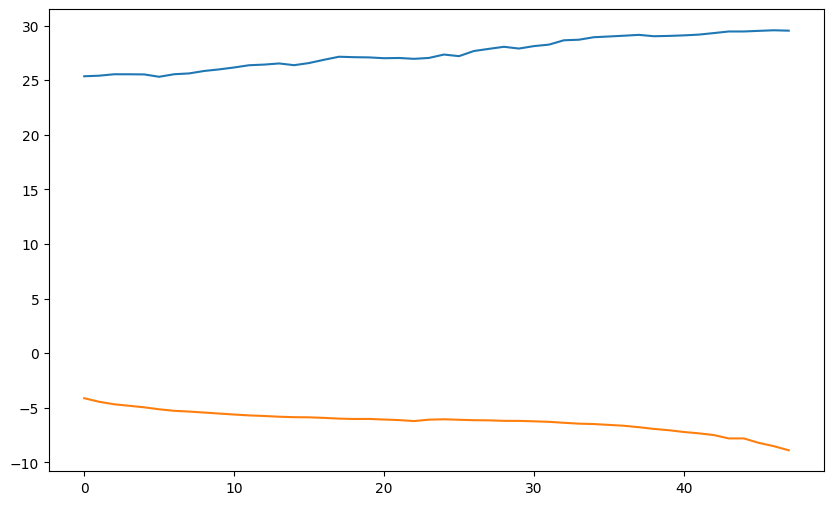

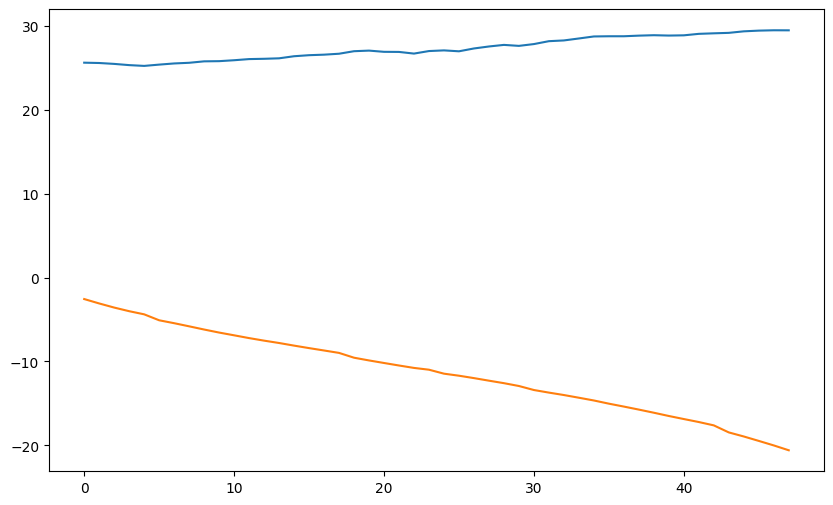

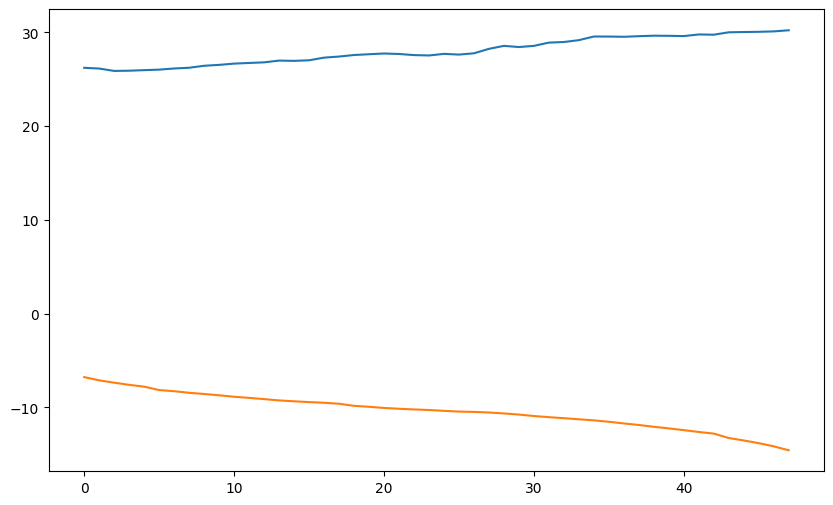

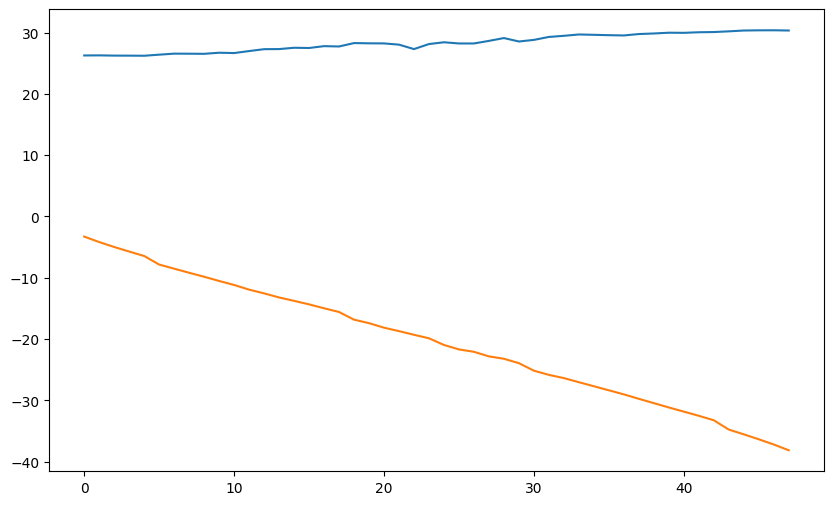

...

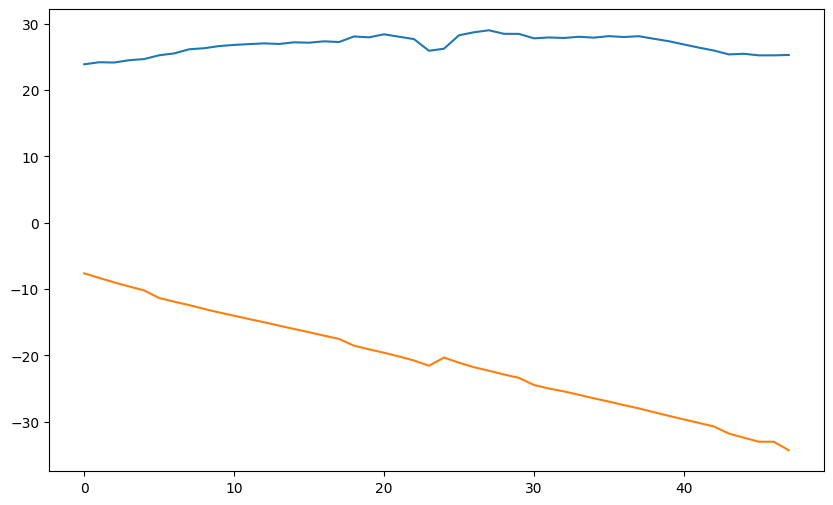

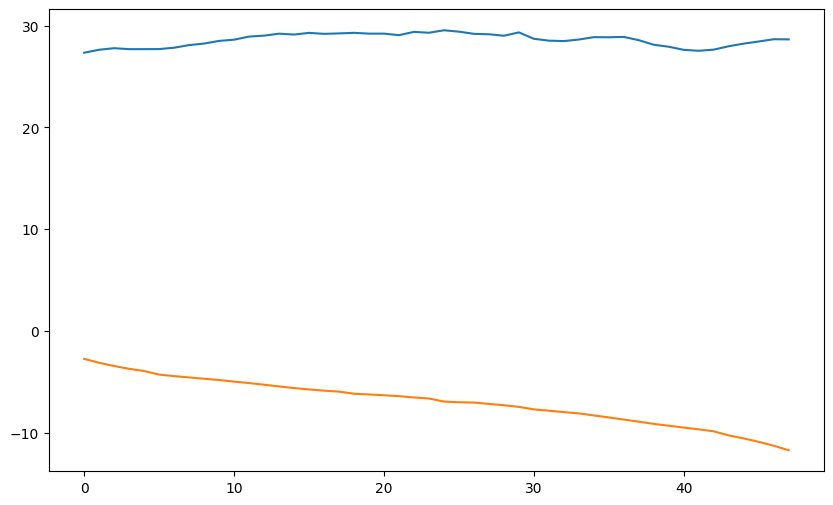

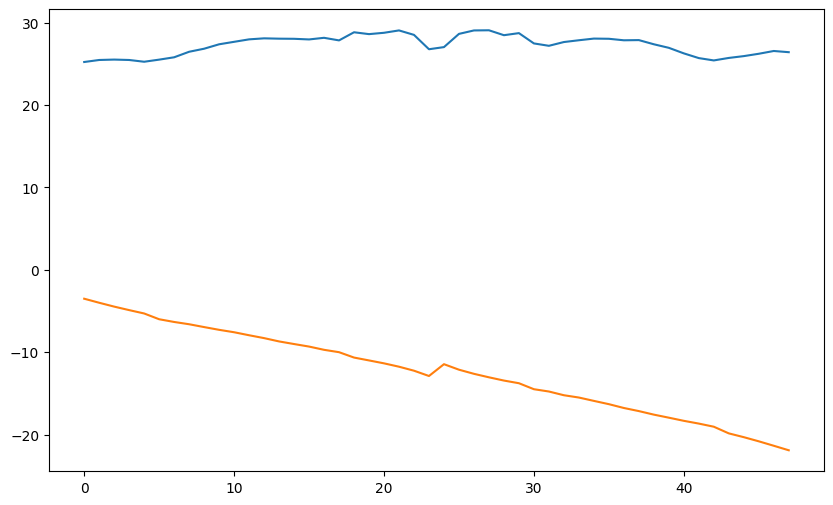

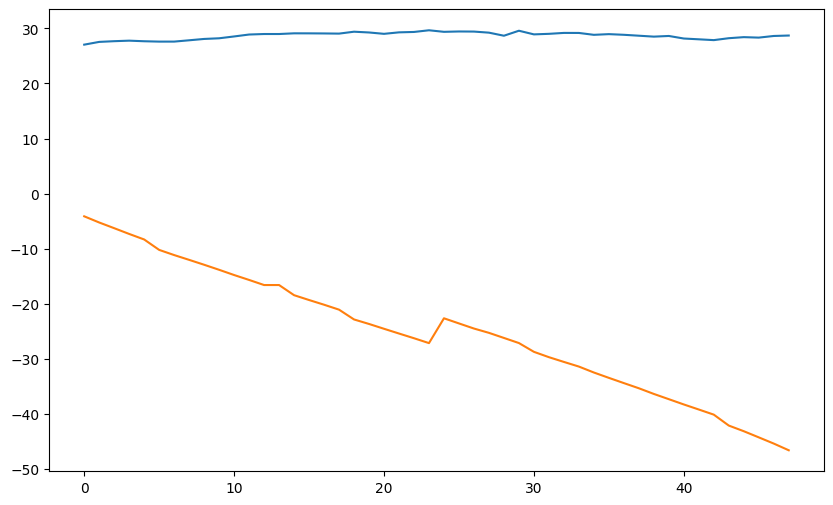

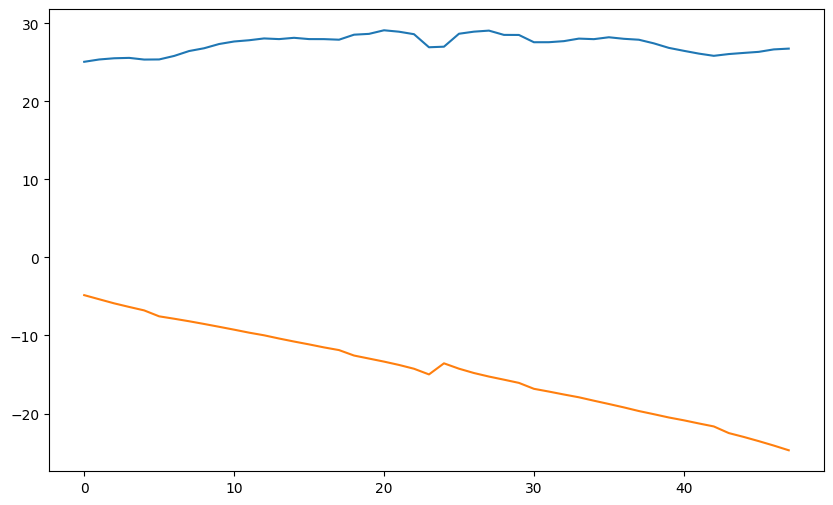

In [16]:
for i in range(500):
    plt.figure(figsize=(10, 6))
    plt.plot(amp_data[i,:])
    plt.plot(phase_data[i,:])
    plt.show()
    